In [159]:
## Author: Sakshi Mishra, Yunis ##
## Final Policy Project ##
## Policy Question: See if weather has an effect on number of taxies been taken for short distance travel in NYC. If so do campaigns to promote usage of public transport even when weather is not that favorable. On bad weather days congestion can be high and people using taxies for short distance travel (less than 1 mile) will only add to congestion / bad traffic conditions on bad weather days. ##
## Answer: We did find that on Snow and Cold days short distance travel increases as compared to Normal days ##

## Data: NYC Taxi trip data from Jan 2016 and June 2016 joined with NYC weather data of 2016.


import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
%matplotlib inline 
geolocator = Nominatim(user_agent="appy")

### Load data
nyc_mausam = pd.read_csv('weather_data_nyc_centralpark_2016.csv')
taxi_jan2016 = pd.read_csv('yellow_tripdata_2016-01.csv')

/Users/granth/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (0,3,4,5,6,7,9,10,11,12,13,14,15,16,17,18) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [181]:
# Remove all the rows where location data was not recorded
df = taxi_jan2016[taxi_jan2016.pickup_latitude != 0]
del top_pickup_loc;

In [191]:
## We have about 22 Million rows. To reduce the computational cost, we are sampling the data here. Sampling rate is 5%
df_percent = df.sample(frac=0.05)

In [197]:
df_percent['pick_up_latlng'] = df_percent.apply(lambda row: '{0:.3f},{1:.3f}'.format(float(row['pickup_latitude']), float(row['pickup_longitude'])), axis=1)
df_percent['drop_off_latlng'] = df_percent.apply(lambda row: '{0:.3f},{1:.3f}'.format(float(row['dropoff_latitude']), float(row['dropoff_longitude'])), axis=1)

In [206]:
## Joining the NYC weather data and NYC taxi data 

nyc_mausam['date'] = pd.to_datetime(nyc_mausam.date).dt.date
df_percent['date'] = pd.to_datetime(df_percent.tpep_pickup_datetime).dt.date
nyc_mausam = nyc_mausam.replace('T',-1) 
nyc_mausam[['precipitation','snow depth','snow fall']] = nyc_mausam[['precipitation','snow depth','snow fall']].astype('float')


def mausam_tag(x):
    if ((x['precipitation'] >= 0.1) and (x['snow fall'] ==0.0)):
        return 'Rain'
    elif (x['snow fall'] != 0):
        return 'Snow'
    elif((x['maximum temperature'] > 85) and (x['precipitation']==0.0)):   
        return 'Hot'
    elif((x['maximum temperature'] < 40) and (x['precipitation']==0.0)):
        return 'Cold'
    else:
        return 'Normal Day'
        
## Creating a weather category by looking at weather data. We create 5 categories based on the day's weather. These categories are 'Rain,Snow,Hot ( > 85* F ),Cold (but no precipitation/snow), Normal Day'
        
nyc_mausam['weather_category'] = nyc_mausam[['precipitation','maximum temperature','snow fall']].apply(mausam_tag, axis=1)


jn = df_percent.merge(nyc_mausam,on='date',how='inner') # Joining data on date
jn = jn.replace('T',-1) ## replacing Trace with -1
jn[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']] = jn[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']].astype(float)

In [268]:
## Selecting the top most location by pickup spot for further analyis
top_pickup_loc = jn['pick_up_latlng'].value_counts().keys()[0]
top_dopoff_loc = jn['drop_off_latlng'].value_counts().keys()[0]

In [ ]:
'''Below we rount the trip distance to the nearest intiger and the generate the a distribution of trip distance for each weather category. Here 1.0 represents all trips that were less than or equal to 1 mile, 2.0 is all trips between 1 and 2 miles and so on. Some of data seems incorrect as trip distance recorded was 0.

The distributions below show that on Snow and Colder days the number of short trips increase as compared to Normal days. 

In [291]:
jn[(jn['weather_category']== 'Snow') & (jn.trip_distance.astype(float) <= 10)].trip_distance_round.astype(float).value_counts(normalize=True)

2.0     0.346335
1.0     0.278506
3.0     0.161007
4.0     0.079571
5.0     0.044247
6.0     0.026754
7.0     0.018038
10.0    0.014333
8.0     0.013764
9.0     0.012699
0.0     0.004745
Name: trip_distance_round, dtype: float64

In [292]:
jn[(jn['weather_category']== 'Rain') & (jn.trip_distance.astype(float) <= 10)].trip_distance_round.astype(float).value_counts(normalize=True)

2.0     0.345215
1.0     0.263583
3.0     0.164925
4.0     0.083313
5.0     0.047254
6.0     0.029137
7.0     0.020078
8.0     0.013857
10.0    0.013825
9.0     0.013422
0.0     0.005390
Name: trip_distance_round, dtype: float64

In [293]:
jn[(jn['weather_category']== 'Cold') & (jn.trip_distance.astype(float) <= 10)].trip_distance_round.astype(float).value_counts(normalize=True)

2.0     0.348663
1.0     0.286051
3.0     0.157046
4.0     0.078195
5.0     0.042723
6.0     0.026381
7.0     0.018181
8.0     0.013312
9.0     0.012421
10.0    0.012018
0.0     0.005010
Name: trip_distance_round, dtype: float64

In [294]:
jn[(jn['weather_category']== 'Normal Day') & (jn.trip_distance.astype(float) <= 10)].trip_distance_round.astype(float).value_counts(normalize=True)

2.0     0.344739
1.0     0.269156
3.0     0.162491
4.0     0.080333
5.0     0.045389
6.0     0.029333
7.0     0.020010
8.0     0.014808
10.0    0.014460
9.0     0.013807
0.0     0.005475
Name: trip_distance_round, dtype: float64

In [295]:
jn[(jn['weather_category']== 'Hot') & (jn.trip_distance.astype(float) <= 10)].trip_distance_round.astype(float).value_counts(normalize=True)

2.0     0.334005
1.0     0.248112
3.0     0.168829
4.0     0.088107
5.0     0.051671
6.0     0.034302
7.0     0.023344
8.0     0.016089
10.0    0.015076
9.0     0.014560
0.0     0.005906
Name: trip_distance_round, dtype: float64

In [381]:
### Please find the .html files for the code below for the full interactive map. Notebook was not rendering all the points inline, hence we generated .html files

## Interactive plot of pickup location for a Snowy day
from folium.plugins import MarkerCluster
NYC_COORDINATES = (40.7829, -73.9654)
# for speed purposes
MAX_RECORDS = 5000
# create empty map zoomed in on San Francisco
mapp = folium.Map(location=NYC_COORDINATES, zoom_start=12)
mc = MarkerCluster()
for row in jn[jn['weather_category']== 'Snow'][0:MAX_RECORDS].iterrows():
    mc.add_child(folium.Marker(location=[row[1]['pickup_latitude'],  row[1]['pickup_longitude']]))
mapp.add_child(mc)
mapp

In [382]:
## Interactive plot of pickup location for a Cold day
mapp = folium.Map(location=NYC_COORDINATES, zoom_start=12)
MAX_RECORDS =5000
mc = MarkerCluster()
for row in jn[jn['weather_category']== 'Cold'][0:MAX_RECORDS].iterrows():
    mc.add_child(folium.Marker(location=[row[1]['pickup_latitude'],  row[1]['pickup_longitude']]))
mapp.add_child(mc)
mapp

In [385]:
## Interactive plot of pickup location for a Rainy Day
mapp = folium.Map(location=NYC_COORDINATES, zoom_start=12)
mc = MarkerCluster()
MAX_RECORDS = 5000
for row in jn[jn['weather_category']== 'Rain'][0:MAX_RECORDS].iterrows():
    mc.add_child(folium.Marker(location=[row[1]['pickup_latitude'],  row[1]['pickup_longitude']]))
mapp.add_child(mc)
mapp

In [386]:
## Interactive plot of pickup location for a Normal Day
mapp = folium.Map(location=NYC_COORDINATES, zoom_start=12)
mc = MarkerCluster()
MAX_RECORDS = 5000
for row in jn[jn['weather_category']== 'Normal Day'][0:MAX_RECORDS].iterrows():
    mc.add_child(folium.Marker(location=[row[1]['pickup_latitude'],  row[1]['pickup_longitude']]))
mapp.add_child(mc)
mapp

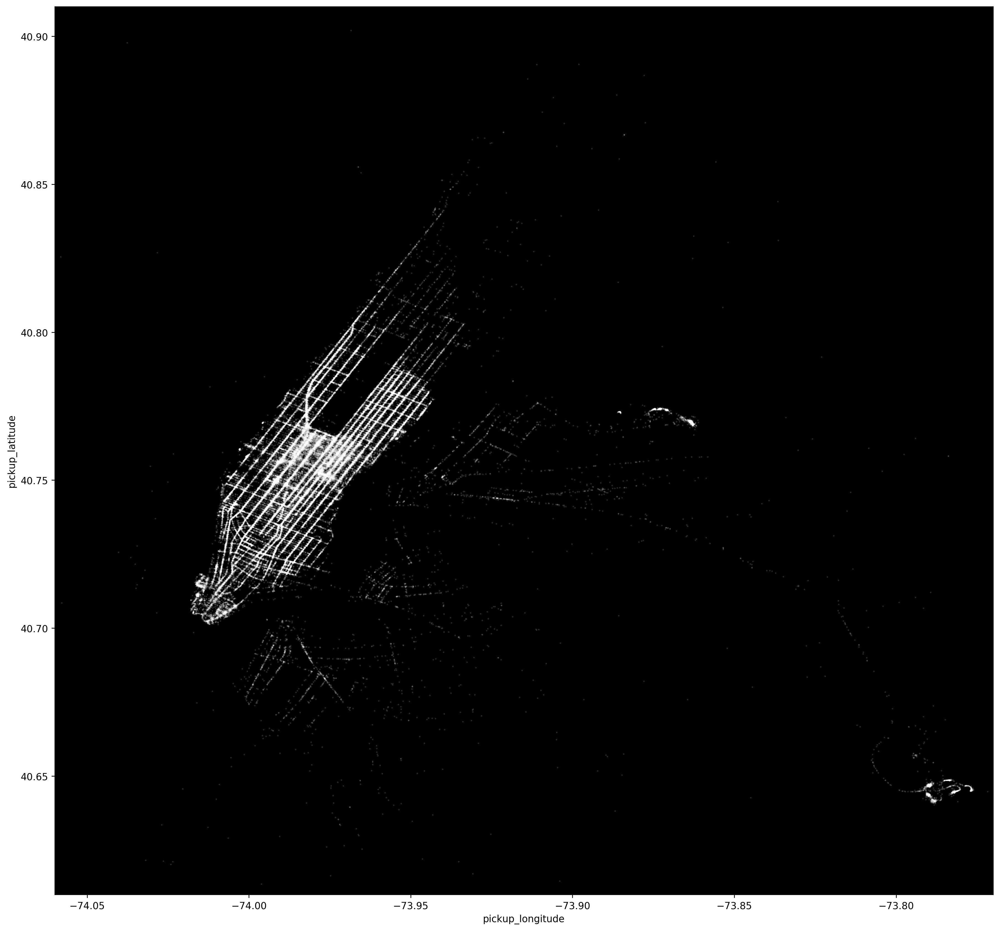

In [360]:
### Scatter plot for "Cold" days ###
new_style = {'grid': False} #Remove grid
matplotlib.rc('axes', **new_style)
from matplotlib import rcParams
rcParams['figure.figsize'] = (17.5, 17) #Size of figure
rcParams['figure.dpi'] = 250
P=jn[jn['weather_category']== 'Cold'].plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
P.set_facecolor('black') #Background Color

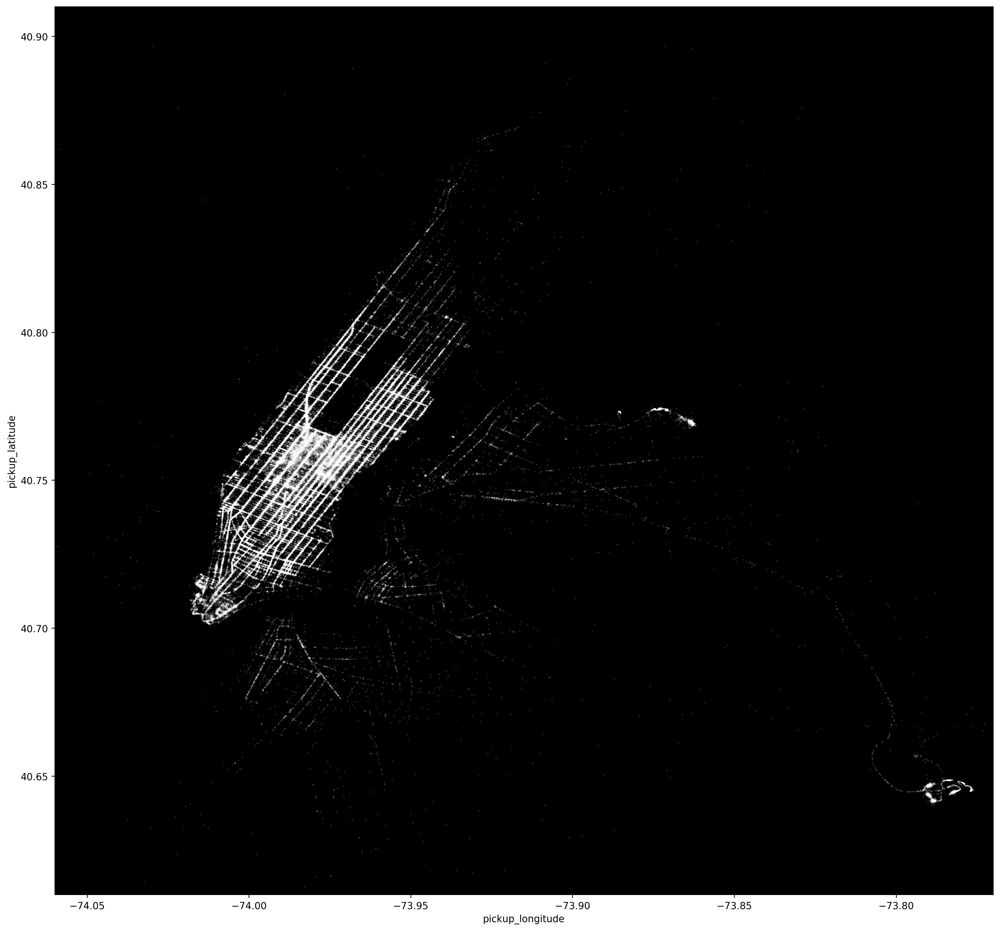

In [309]:
#pd.options.display.mpl_style = 'default' #Better Styling 
new_style = {'grid': False} #Remove grid
matplotlib.rc('axes', **new_style)
from matplotlib import rcParams
rcParams['figure.figsize'] = (17.5, 17) #Size of figure
rcParams['figure.dpi'] = 250
P=jn[jn['weather_category']== 'Rain'].plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
P.set_facecolor('black') #Background Color

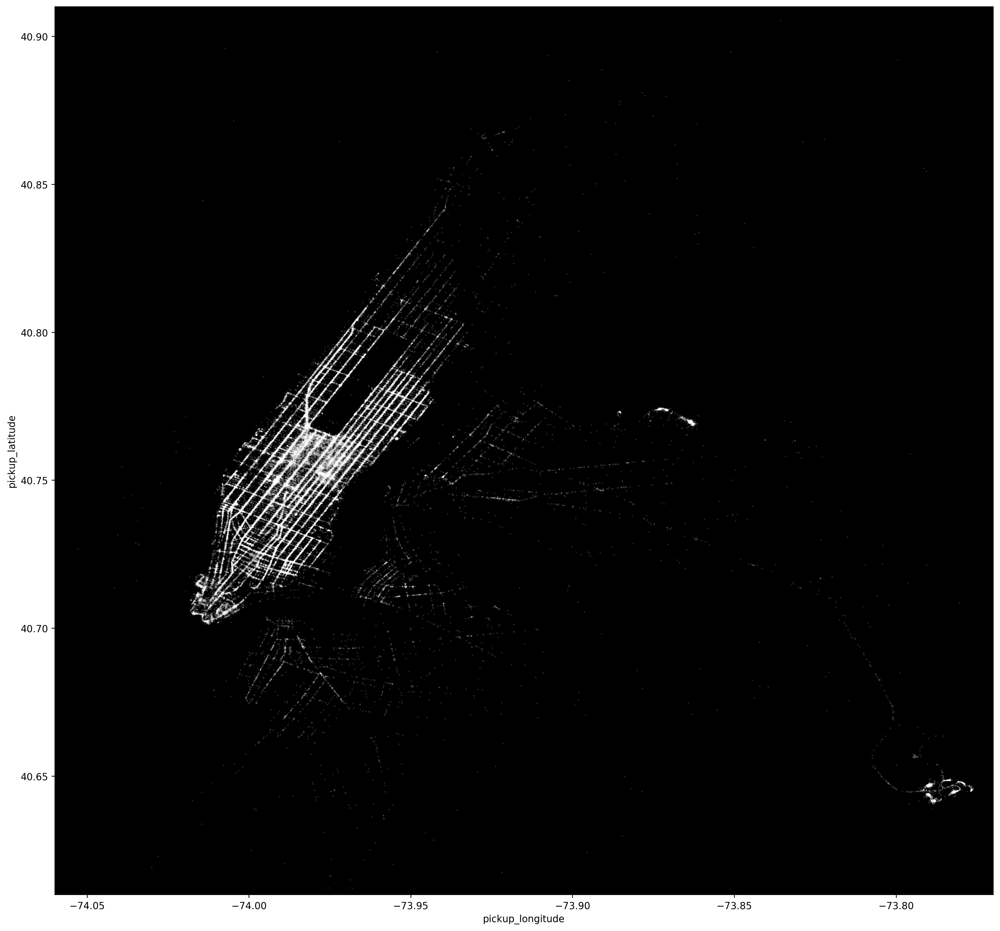

In [310]:
#pd.options.display.mpl_style = 'default' #Better Styling 
new_style = {'grid': False} #Remove grid
matplotlib.rc('axes', **new_style)
from matplotlib import rcParams
rcParams['figure.figsize'] = (17.5, 17) #Size of figure
rcParams['figure.dpi'] = 250
P=jn[jn['weather_category']== 'Hot'].plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
P.set_facecolor('black') #Background Color

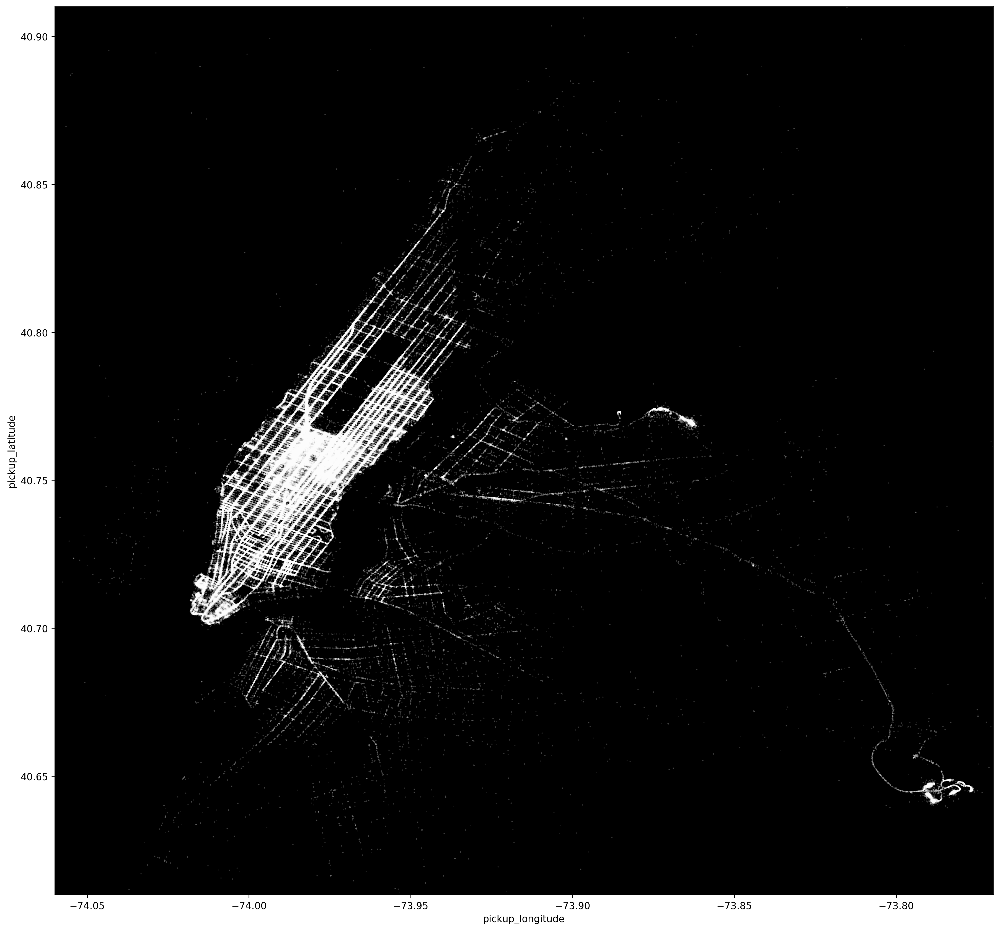

In [311]:
#pd.options.display.mpl_style = 'default' #Better Styling 
new_style = {'grid': False} #Remove grid
matplotlib.rc('axes', **new_style)
from matplotlib import rcParams
rcParams['figure.figsize'] = (17.5, 17) #Size of figure
rcParams['figure.dpi'] = 250
P=jn[jn['weather_category']== 'Normal Day'].plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.6)
P.set_facecolor('black') #Background Color

In [366]:
def hmap(jn,mausam,n=1000):  
    from folium.plugins import MarkerCluster
    NYC_COORDINATES = (40.7829, -73.9654)
    # for speed purposes
    MAX_RECORDS = n
    # create empty map zoomed in on San Francisco
    mapp = folium.Map(location=NYC_COORDINATES, zoom_start=12)
    mc = MarkerCluster()
    for row in jn[jn['weather_category']== mausam][0:MAX_RECORDS].iterrows():
        mc.add_child(folium.Marker(location=[row[1]['pickup_latitude'],  row[1]['pickup_longitude']]))
    mapp.add_child(mc)
    mapp.save(mausam+'.html')
    
for k in ['Snow','Hot','Rain','Cold','Normal Days']:
    hmap(jn,k,75000) 